In [162]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.ndimage import label

In [163]:
# Define parameters

grid_size = (50, 50)
np.random.seed(123)
criminality = np.random.rand(*grid_size) # Define the initial criminality for every cell
education = np.random.rand(*grid_size) # Define the education for every cell (here fixed, but can be linked to data in final model)
income = np.random.rand(*grid_size) # Define the income for every cell (here fixed, but can be linked to data in final model)
alpha = 0.3 # Assign weight for influence of criminality in own neighbourhood
beta = 1 - alpha # Assign weight for influence of criminality in other neighbourhoods 
influence_diff = 0.1 # Assign weight for difference in influence of "bad" neighbourhoods compared to "good" neighbourhoods
percolation_threshold = 0.5 # Define the percolation threshold to later calculate the giant component

In [164]:
'''
states  = [0, 0.5, 1]
criminality = np.random.choice(states, size=grid_size)
'''

'\nstates  = [0, 0.5, 1]\ncriminality = np.random.choice(states, size=grid_size)\n'

In the following cell, we set up the model such that, in each time period, we update the criminality level $C$ of each cell based on the transition function:

$$ C_{t+1} =  \alpha C_t + (\beta (1 - \gamma)) M + \frac{\beta}{2} L$$

where:
- $\alpha$ controls the sensitivity of the new level of criminality to the cell-self old criminality;
- $\beta$ controls the sensitivity to the neighbors situation;
- $\gamma$ calibrates the dependence of sensitivity to neighbors based on education and income;
- $M$ represents the mean criminality of neighbors with more criminality than the cell of interest;
- $L$ the ones with less criminality.

This distinction (between $M$ and $L$) is necessary, since a higher education/income should reduce the sensitivity to higher criminality, but not to lower.
$\beta$ is scaled by $\frac{1}{2}$ to make it comparable on average to $\beta (1 - \gamma)$.

In [165]:
# Define functions to run simulation

def update_cell(x, y, criminality, education, income, influence_diff): # Update the criminality of a cell based on its neighbours nad itself

    current_state = criminality[x, y]
    neighbors = criminality[max(0, x-1):x+2, max(0,y-1):y+2] # Get the 8 neighbours of the cell
    neighbors = np.delete(neighbors, (neighbors.shape[0] // 2, neighbors.shape[1] // 2)) # Remove the cell itself from the neighbours

    # Here we distinguish between neighbours with more criminality and neighbours with less criminality
    less_crim_influence = np.mean(neighbors[neighbors <= current_state]) if np.any(neighbors <= current_state) else 0
    more_crim_influence = np.mean(neighbors[neighbors > current_state]) if np.any(neighbors > current_state) else 0

    gamma = np.mean([education[x, y], income[x, y]]) # Here we calculate the average sensitivity of the cell to "external" criminality, so that higher education/income result in lower sensitivity (following line)

    # Here we calculate the influence of neighbors distinguishing between more and less criminality (compared to the cell itself) because higher education/income should lower the sensitivity to more criminality but not to less criminality
    weight_more = (beta * np.clip(1 - gamma, 0.1, 0.9)) + influence_diff # We clip the value to avoid the weight to be 0
    weight_less = (beta / 2) - influence_diff

    # Here we calculate the new criminality of the cell based on the criminality of the cell itself and the influence of the neighbours
    new_state = (
        alpha * current_state +
        weight_more * more_crim_influence +
        weight_less * less_crim_influence
    )
    return np.clip(new_state, 0, 1)

def update_grid(criminality, education, income, influence_diff): # Update the criminality of the whole grid based on the update_cell function

    new_criminality = np.zeros_like(criminality)
    for x in range(grid_size[0]):
        for y in range(grid_size[1]):
            new_criminality[x, y] = update_cell(x, y, criminality, education, income, influence_diff)
    return new_criminality

def giant_component(criminality, percolation_threshold): # Compute the size of the giant component in the criminality grid (as fraction of the grid size)

    perc_cells = criminality >= percolation_threshold # Output the grid with True value for cells with criminality above the percolation threshold
    labeled_crim, num_features = label(perc_cells) # Label the connected components in the grid (every cluster of connected cells gets a unique label)

    components = np.bincount(labeled_crim.ravel()) # Count the number of cells in each connected component
    giant_component = np.max(components[1:]) if len(components) > 1 else 0 # Get the size of the largest connected component

    return giant_component / criminality.size

In [166]:
'''
# Define functions to run simulation

def update_cell(x, y, criminality, education, income): # Update the criminality of a cell based on its neighbours nad itself

    current_state = criminality[x, y]
    neighbors = criminality[max(0, x-1):x+2, max(0,y-1):y+2] # Get the 8 neighbours of the cell
    neighbors = np.delete(neighbors, (neighbors.shape[0] // 2, neighbors.shape[1] // 2)) # Remove the cell itself from the neighbours

    # Here we distinguish between neighbours with more criminality and neighbours with less criminality
    less_crim_influence = np.mean(neighbors[neighbors <= current_state]) if np.any(neighbors <= current_state) else 0
    more_crim_influence = np.mean(neighbors[neighbors > current_state]) if np.any(neighbors > current_state) else 0

    gamma = np.mean([education[x, y], income[x, y]]) # Here we calculate the average sensitivity of the cell to "external" criminality, so that higher education/income result in lower sensitivity (following line)

    # Here we calculate the influence of neighbors distinguishing between more and less criminality (compared to the cell itself) because higher education/income should lower the sensitivity to more criminality but not to less criminality
    weight_more = beta * np.clip(1 - gamma, 0.1, 0.9) # We clip the value to avoid the weight to be 0
    weight_less = beta / 2

    # Here we calculate the new criminality of the cell based on the criminality of the cell itself and the influence of the neighbours
    new_state = (
        current_state +
        weight_more * more_crim_influence +
        weight_less * less_crim_influence
    )

    if new_state > 0.66:
        new_state = 1
    elif new_state > 0.33:
        new_state = 0.5
    else:
        new_state = 0
    
    return new_state

def update_grid(criminality, education, income): # Update the criminality of the whole grid based on the update_cell function
    new_criminality = np.zeros_like(criminality)
    for x in range(grid_size[0]):
        for y in range(grid_size[1]):
            new_criminality[x, y] = update_cell(x, y, criminality, education, income)
    return new_criminality
'''

'\n# Define functions to run simulation\n\ndef update_cell(x, y, criminality, education, income): # Update the criminality of a cell based on its neighbours nad itself\n\n    current_state = criminality[x, y]\n    neighbors = criminality[max(0, x-1):x+2, max(0,y-1):y+2] # Get the 8 neighbours of the cell\n    neighbors = np.delete(neighbors, (neighbors.shape[0] // 2, neighbors.shape[1] // 2)) # Remove the cell itself from the neighbours\n\n    # Here we distinguish between neighbours with more criminality and neighbours with less criminality\n    less_crim_influence = np.mean(neighbors[neighbors <= current_state]) if np.any(neighbors <= current_state) else 0\n    more_crim_influence = np.mean(neighbors[neighbors > current_state]) if np.any(neighbors > current_state) else 0\n\n    gamma = np.mean([education[x, y], income[x, y]]) # Here we calculate the average sensitivity of the cell to "external" criminality, so that higher education/income result in lower sensitivity (following line)\

In [167]:
'''
# Define functions to run simulation

sensitivity = (education + income) / 2 # Define the sensitivity of every cell to criminality

def moore_neighbors(x, y, grid):

    neighbors = []
    for i in range(max(0, x - 1), min(grid.shape[0], x + 2)):
        for j in range(max(0, y - 1), min(grid.shape[1], y + 2)):
            if (i, j) != (x, y):
                neighbors.append(grid[i, j])
    return neighbors

def update_cell(x, y, criminality, education, income): # Update the criminality of a cell based on its neighbours nad itself

    current_state = criminality[x, y]
    neighbors = moore_neighbors(x, y, criminality) # Get the 8 neighbours of the cell
    diff_list = neighbors - current_state

    # Here we calculate the new criminality of the cell based on the criminality of the cell itself and the influence of the neighbours
    new_state = (
        current_state +
        (sum(diff / (1 + sensitivity[x, y]) if diff > 0 else diff for diff in diff_list)) / 8
    )
    return np.clip(new_state, 0, 1)

def update_grid(criminality, education, income): # Update the criminality of the whole grid based on the update_cell function
    new_criminality = np.zeros_like(criminality)
    for x in range(grid_size[0]):
        for y in range(grid_size[1]):
            new_criminality[x, y] = update_cell(x, y, criminality, education, income)
    return new_criminality
'''

'\n# Define functions to run simulation\n\nsensitivity = (education + income) / 2 # Define the sensitivity of every cell to criminality\n\ndef moore_neighbors(x, y, grid):\n\n    neighbors = []\n    for i in range(max(0, x - 1), min(grid.shape[0], x + 2)):\n        for j in range(max(0, y - 1), min(grid.shape[1], y + 2)):\n            if (i, j) != (x, y):\n                neighbors.append(grid[i, j])\n    return neighbors\n\ndef update_cell(x, y, criminality, education, income): # Update the criminality of a cell based on its neighbours nad itself\n\n    current_state = criminality[x, y]\n    neighbors = moore_neighbors(x, y, criminality) # Get the 8 neighbours of the cell\n    diff_list = neighbors - current_state\n\n    # Here we calculate the new criminality of the cell based on the criminality of the cell itself and the influence of the neighbours\n    new_state = (\n        current_state +\n        (sum(diff / (1 + sensitivity[x, y]) if diff > 0 else diff for diff in diff_list)) /

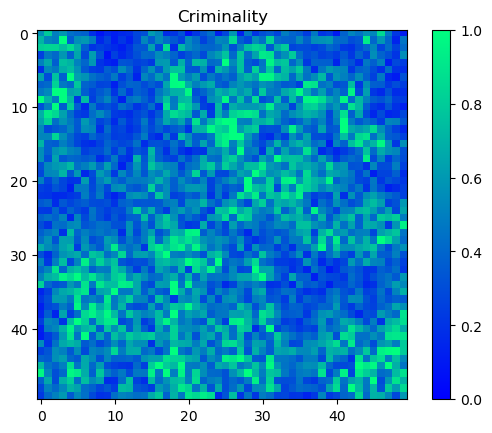

In [168]:
# Run the simulation and output the results as animation

def animate(t): # Define function to use in FuncAnimation (update grid for every timestep)
    global criminality
    criminality = update_grid(criminality, education, income, influence_diff)
    cax.set_array(criminality)
    return cax

fig, ax = plt.subplots()
cax = ax.imshow(criminality, cmap='winter', vmin=0, vmax=1)
fig.colorbar(cax, ax=ax)
ax.set_title('Criminality')

timesteps = 300

ani = FuncAnimation(fig, animate, frames=timesteps, interval=500)

HTML(ani.to_jshtml())

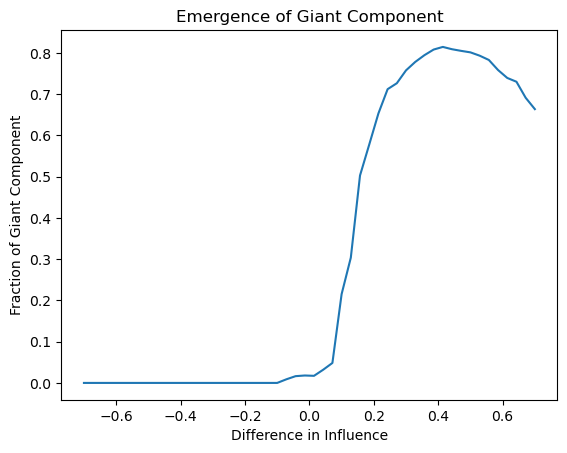

In [169]:
timesteps = 100
influence_diff_list = np.linspace(-0.7, 0.7, 50) # Define the range of influence difference (of "bad" influence compared to the "good" one) to study the emergence of the giant component
giant_fractions = []
init_criminality = np.random.rand(*grid_size)

for influence_diff in influence_diff_list: # Loop through the influence difference values
    criminality = init_criminality # Reset the criminality grid
    for t in range(timesteps): # Run the simulation for a long enough time
        criminality = update_grid(criminality, education, income,influence_diff)
    giant_fractions.append(giant_component(criminality, percolation_threshold)) # Get the size of the giant component

# Plot the size of the ginat component after the fixed amount of timesteps (and a fixed threshold) for every influence difference value
plt.plot(influence_diff_list, giant_fractions)
plt.title('Emergence of Giant Component')
plt.xlabel('Difference in Influence')
plt.ylabel('Fraction of Giant Component')
plt.show()